# Decision Tree Lab

In [2]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.io import arff
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

## 1 Debug and Eval

### 1.1 (5%) Debug

- Train on the [Iris Dataset](https://raw.githubusercontent.com/cs472ta/CS472/master/datasets/iris.arff) using all default parameters.
- If using Dataframes you may want to change the class values from bytecodes to strings with
iris_df['class'] = iris_df['class'].str.decode('utf-8')

Expected Accuracy = [1.0]


Accuracy:  1.0


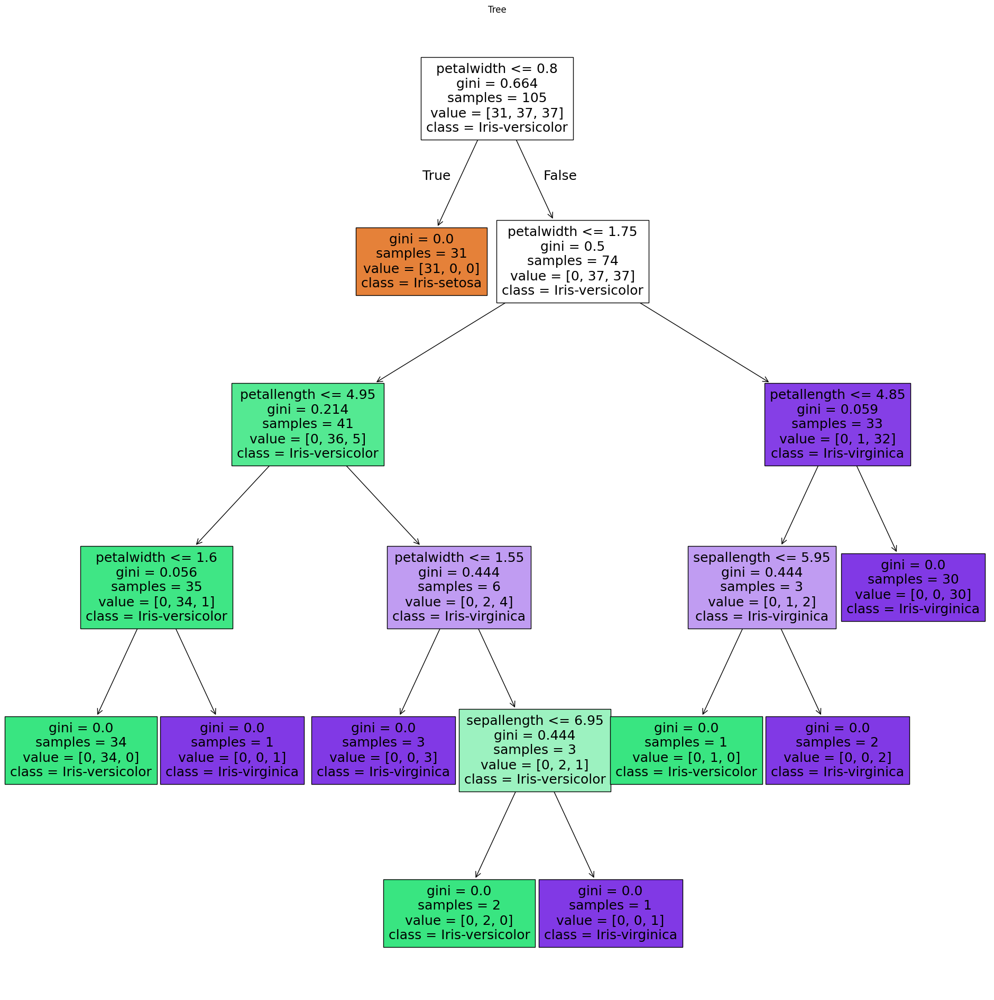

In [3]:
#Debug

data = arff.loadarff('irisData.arff')
iris_df = pd.DataFrame(data[0])

iris_df['class'] = iris_df['class'].str.decode('utf-8')
X = iris_df.drop('class', axis=1)
y = iris_df['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: ', accuracy)

plt.figure(figsize=(24, 24))
plot_tree(clf, filled=True, feature_names=X.columns, class_names=clf.classes_)
plt.title("Tree")
plt.show()

### 1.2 (5%) Evaluation

- Train on the iris data set again but this time with max_depth = 3 and output the accuracy

Accuracy:  1.0


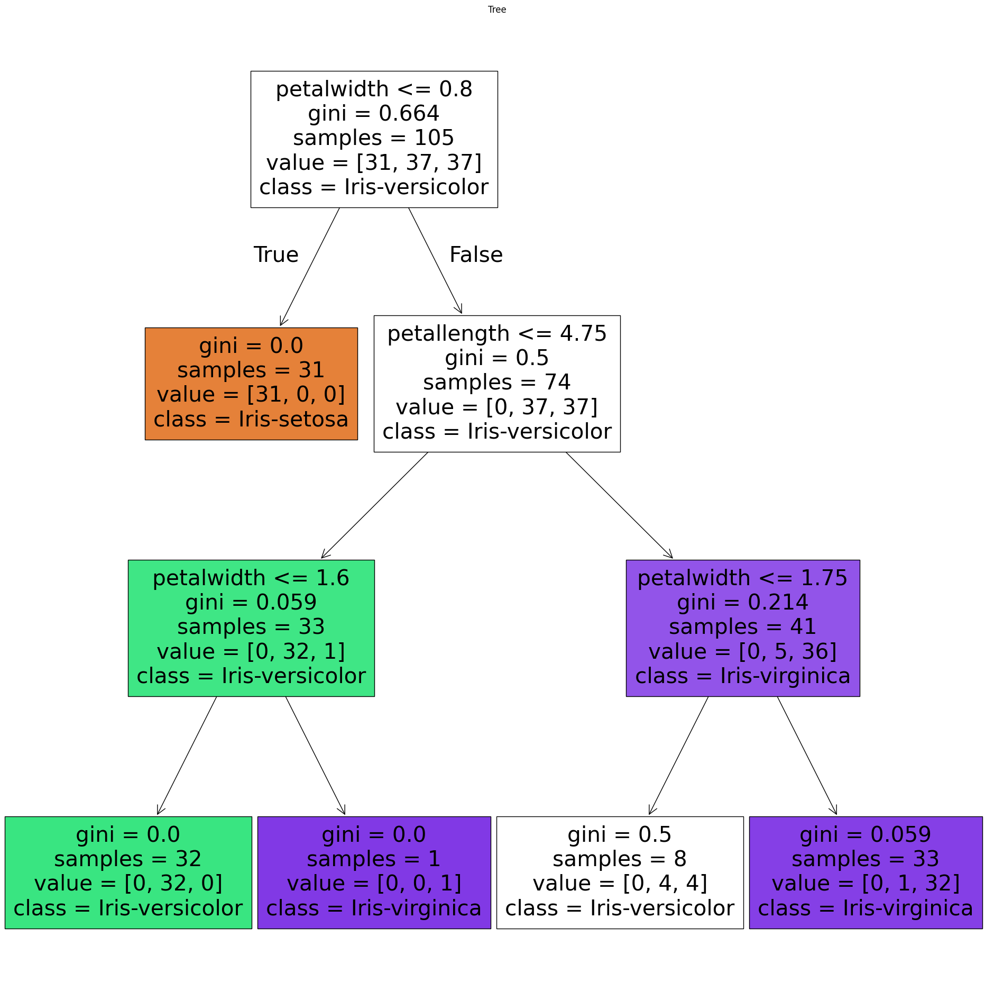

In [4]:
# Evaluation

data = arff.loadarff('irisData.arff')
iris_df = pd.DataFrame(data[0])

iris_df['class'] = iris_df['class'].str.decode('utf-8')
X = iris_df.drop('class', axis=1)
y = iris_df['class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

clf = DecisionTreeClassifier(max_depth=3)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: ', accuracy)

plt.figure(figsize=(24, 24))
plot_tree(clf, filled=True, feature_names=X.columns, class_names=clf.classes_)
plt.title("Tree")
plt.show()

**I expected the accuracy score to go down from 1 when I restricted the depth to 3. Although this didn't happen, I suspect it's because the initial decision takes out all instances of setosa, and the third decision takes out almost all of versicolor, leaving most other samples to be virginica. I suspect with a more complex dataset, the outcome would be different**

## 2. Missing Values, N-fold CV, and Decision Tree Items  

### 2.1 (15%) Handling missing values
- Use this [Voting Dataset with missing values](https://raw.githubusercontent.com/cs472ta/CS472/master/datasets/voting_with_missing.arff)
- This data set has missing data.  Create an extra feature value for each feature with missing data. For example, if the feature were color with possible values R, G, B, you would add a fourth value (e.g. U or ? for unknown).
- Do not use a stopping criteria. Induce the tree as far as it can go (until classes are pure or there are no more data or attributes to split on).
- SKlearn does not allow nominal features, which initially seems odd. However, SKlearn uses the binary CART algorithm where a nominal data value like color is broken down into blue or not blue, red or not red, etc.  It is thus natural to just use one-hot encoding for each nominal feature.
- Use an 80/20 train/test split.
- Report the training and test set accuracies.

Training Set Accuracy: 1.0
Test Set Accuracy: 0.9425287356321839


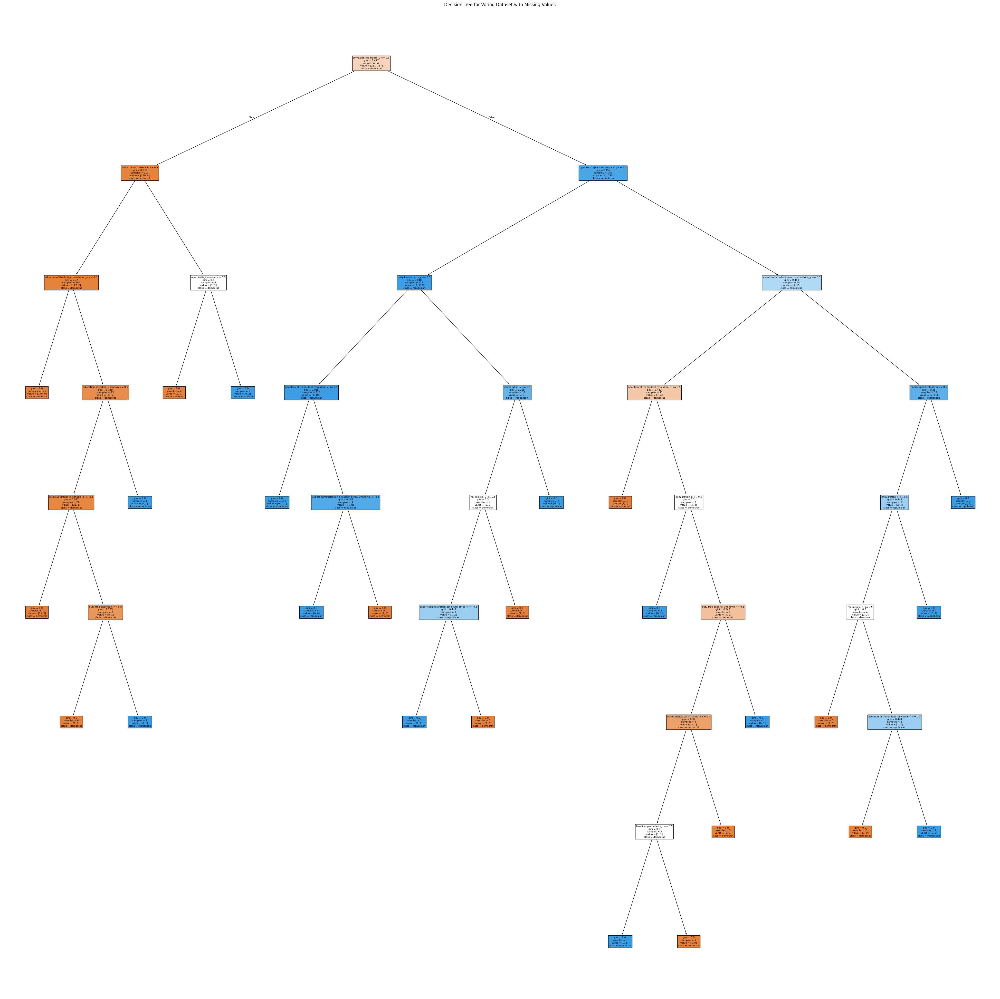

In [5]:
data = arff.loadarff('votingMissingData.arff')
vm_df = pd.DataFrame(data[0])

vm_df = vm_df.apply(lambda col: col.str.decode('utf-8') if col.dtype == 'object' else col)

vm_df.replace('?', 'Unknown', inplace=True)
X = vm_df.drop('Class', axis=1)
y = vm_df['Class']

X_encoded = pd.get_dummies(X, drop_first=False)

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

vm_clf = DecisionTreeClassifier()
vm_clf.fit(X_train, y_train)

y_train_pred = vm_clf.predict(X_train)
y_test_pred = vm_clf.predict(X_test)
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f'Training Set Accuracy: {train_accuracy}')
print(f'Test Set Accuracy: {test_accuracy}')

plt.figure(figsize=(50, 50))
plot_tree(vm_clf, filled=True, feature_names=X_encoded.columns, class_names=vm_clf.classes_)
plt.title("Decision Tree for Voting Dataset with Missing Values")
plt.show()


Discussion including explaining how the missing values were handled by your model

**The unknown values were handled just like any other value would be. It only split on unknown occasionally, which lead me to believe that when it split on Unknown, it was essentially throwing out the data that had the unknown values. I suspect this because there are no leaf nodes that come directly off of a true Unknown value, only false Unknown values.**

### 2.2 (15%)  N-fold Cross Validation
- Learn the [Cars Dataset](https://raw.githubusercontent.com/cs472ta/CS472/master/datasets/cars.arff) with the decision tree.
- Create a table with the 10-fold cross validation accuracies and show the average predicted accuracy.
- Try it again with 5-fold CV and create and show that table also.

In [6]:
from sklearn.model_selection import cross_val_score, StratifiedKFold

data = arff.loadarff('cars.arff')
cars_df = pd.DataFrame(data[0])

cars_df = cars_df.apply(lambda col: col.str.decode('utf-8') if col.dtype == 'object' else col)

X = cars_df.drop('class', axis=1)
y = cars_df['class']

X_encoded = pd.get_dummies(X, drop_first=False)

car_clf = DecisionTreeClassifier()

cv_10fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
cv_10fold_scores = cross_val_score(car_clf, X_encoded, y, cv=cv_10fold, scoring='accuracy')
cv_10fold_avg_accuracy = np.mean(cv_10fold_scores)

cv_10fold_results = pd.DataFrame({'Fold': range(1, 11), 'Accuracy': cv_10fold_scores})
print("10-Fold Cross-Validation Accuracies:")
print(cv_10fold_results)
print(f"Average 10-Fold Accuracy: {cv_10fold_avg_accuracy:.4f}\n")

cv_5fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_5fold_scores = cross_val_score(car_clf, X_encoded, y, cv=cv_5fold, scoring='accuracy')
cv_5fold_avg_accuracy = np.mean(cv_5fold_scores)

cv_5fold_results = pd.DataFrame({'Fold': range(1, 6), 'Accuracy': cv_5fold_scores})
print("5-Fold Cross-Validation Accuracies:")
print(cv_5fold_results)
print(f"Average 5-Fold Accuracy: {cv_5fold_avg_accuracy:.4f}\n")



10-Fold Cross-Validation Accuracies:
   Fold  Accuracy
0     1  0.971098
1     2  0.971098
2     3  0.959538
3     4  0.971098
4     5  0.971098
5     6  0.965318
6     7  0.988439
7     8  0.965318
8     9  0.988372
9    10  0.982558
Average 10-Fold Accuracy: 0.9734

5-Fold Cross-Validation Accuracies:
   Fold  Accuracy
0     1  0.959538
1     2  0.968208
2     3  0.976879
3     4  0.956522
4     5  0.971014
Average 5-Fold Accuracy: 0.9664



Discussion
**It's kind of crazy how accurate it is. The 10 fold was more accurate, but only because the last two iterations were a lot better than the rest of the accuracies. The same is somewhat true of the last value in the 5 fold. I wonder if that is the same for all n-fold models, that the last iteration is the most accurate.**

**I also though it was interesting that both models went so fast. I see that at least for 5 vs 10, there is no difference in speed. This makes me curious as to the downside of doing more folds, besides diminishing returns once you get down too low (i.e. 1 data point per fold)**

### 2.3 (10%) Decision Tree Intuition
For each of the two problems above (Voting and Cars):
- Print the full tree for each.  You may use tree.plot_tree(clf) or [another way](https://mljar.com/blog/visualize-decision-tree/) if you prefer.  tree.plot_tree has a number of parameters which you can try which let you print more informative trees which can help your discussion.
- Train both again with max_depth = 2 and print these smaller trees and include them in your report.
- Summarize in English what these 2 smaller decision trees have learned (i.e. look at the induced trees and describe what "rules" they discovered).
- Compare your thoughts on important features with the attribute feature_importances_

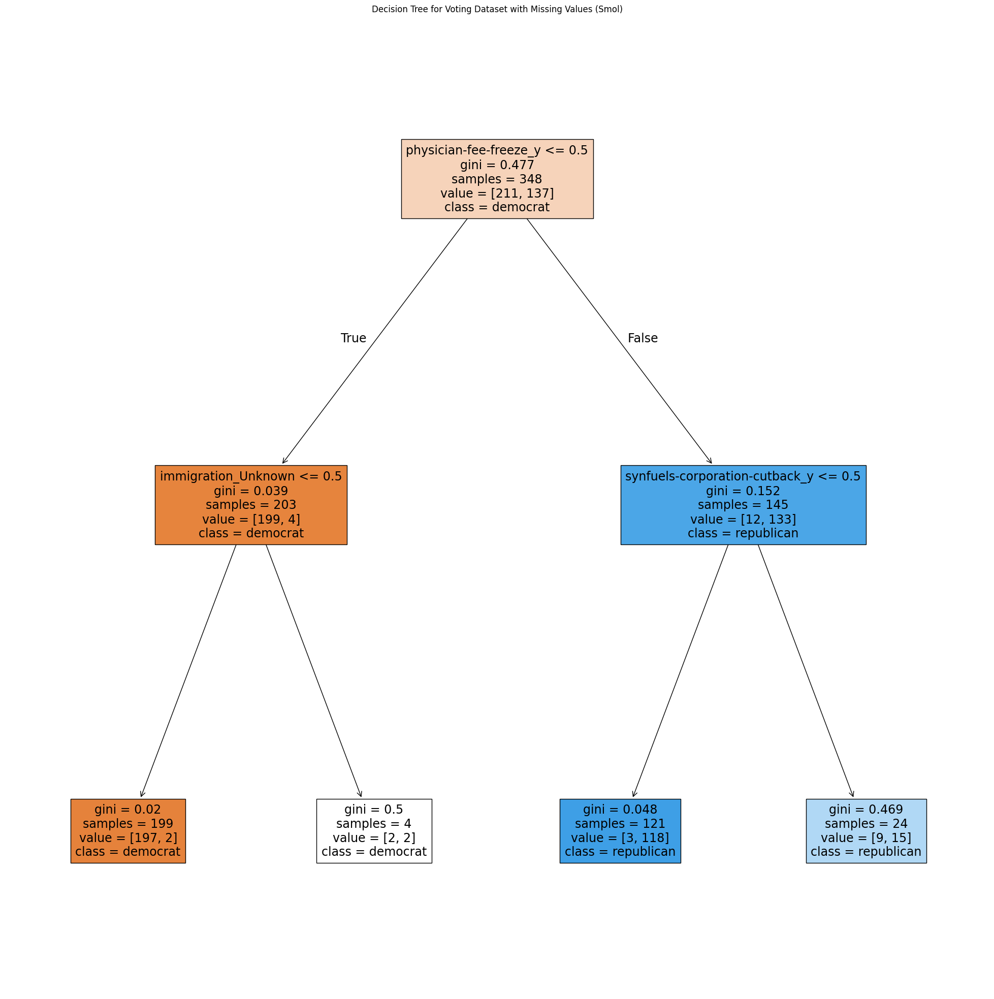

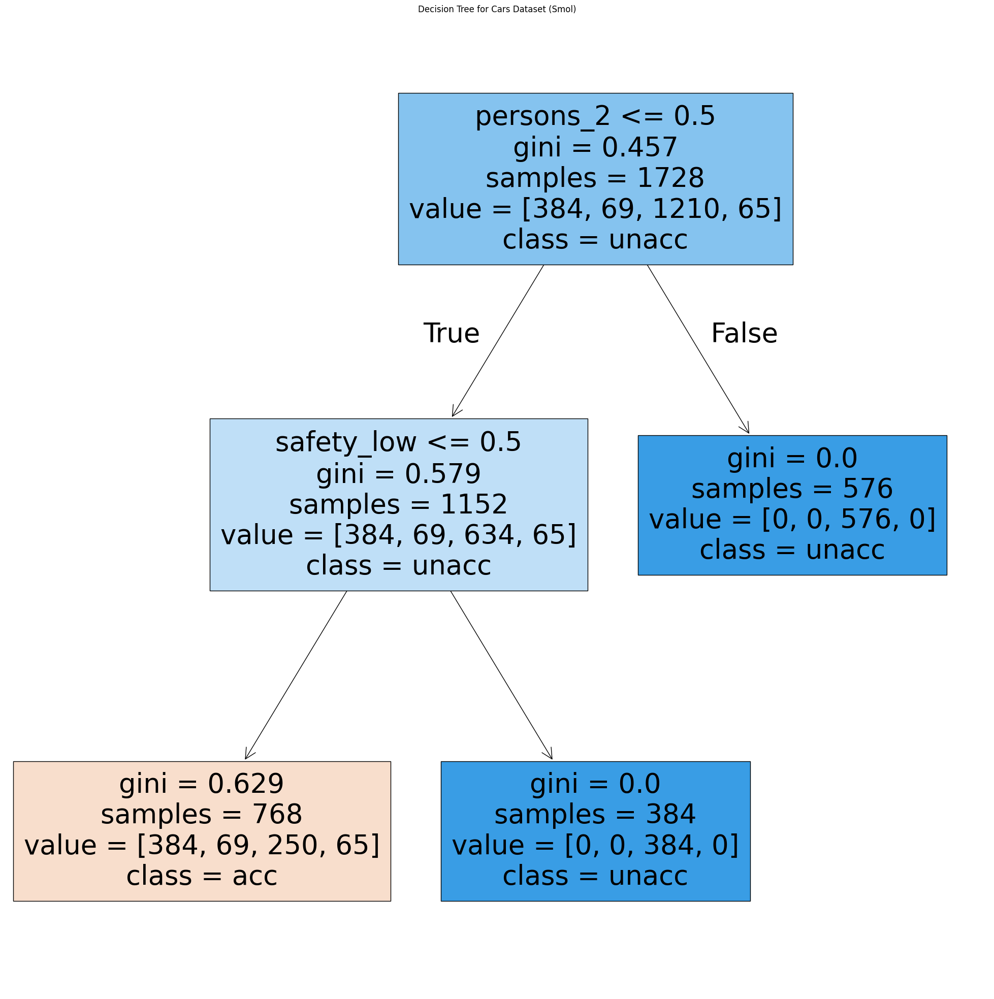

In [7]:
# Voting missing data ORIGINAL
data = arff.loadarff('votingMissingData.arff')
vm_df = pd.DataFrame(data[0])

vm_df = vm_df.apply(lambda col: col.str.decode('utf-8') if col.dtype == 'object' else col)
vm_df.replace('?', 'Unknown', inplace=True)

X = vm_df.drop('Class', axis=1)
y = vm_df['Class']
X_encoded = pd.get_dummies(X, drop_first=False)

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

vm_clf = DecisionTreeClassifier()
vm_clf.fit(X_train, y_train)

plt.figure(figsize=(100, 100))
plot_tree(vm_clf, filled=True, feature_names=X_encoded.columns, class_names=vm_clf.classes_)
plt.title("Decision Tree for Voting Dataset with Missing Values")
plt.show()

# Cars ORIGINAL
data = arff.loadarff('cars.arff')
cars_df = pd.DataFrame(data[0])

cars_df = cars_df.apply(lambda col: col.str.decode('utf-8') if col.dtype == 'object' else col)

X = cars_df.drop('class', axis=1)
y = cars_df['class']
X_encoded = pd.get_dummies(X, drop_first=False)

car_clf = DecisionTreeClassifier()

cv_10fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
cv_5fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

car_clf.fit(X_encoded, y)

plt.figure(figsize=(100, 100))
plot_tree(car_clf, filled=True, feature_names=X_encoded.columns, class_names=car_clf.classes_)
plt.title("Decision Tree for Cars Dataset")
plt.show()

# Voting missing data DEPTH == 2
data = arff.loadarff('votingMissingData.arff')
vm_df = pd.DataFrame(data[0])

vm_df = vm_df.apply(lambda col: col.str.decode('utf-8') if col.dtype == 'object' else col)
vm_df.replace('?', 'Unknown', inplace=True)

X = vm_df.drop('Class', axis=1)
y = vm_df['Class']
X_encoded = pd.get_dummies(X, drop_first=False)

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

vm_clf = DecisionTreeClassifier(max_depth=2)
vm_clf.fit(X_train, y_train)

plt.figure(figsize=(25, 25))
plot_tree(vm_clf, filled=True, feature_names=X_encoded.columns, class_names=vm_clf.classes_)
plt.title("Decision Tree for Voting Dataset with Missing Values (Smol)")
plt.show()

# Cars DEPTH == 2
data = arff.loadarff('cars.arff')
cars_df = pd.DataFrame(data[0])

cars_df = cars_df.apply(lambda col: col.str.decode('utf-8') if col.dtype == 'object' else col)

X = cars_df.drop('class', axis=1)
y = cars_df['class']
X_encoded = pd.get_dummies(X, drop_first=False)

car_clf = DecisionTreeClassifier(max_depth=2)

cv_10fold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
cv_5fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

car_clf.fit(X_encoded, y)

plt.figure(figsize=(25, 25))
plot_tree(car_clf, filled=True, feature_names=X_encoded.columns, class_names=car_clf.classes_)
plt.title("Decision Tree for Cars Dataset (Smol)")
plt.show()


Discuss what the Trees have learned on the 2 data sets
**The voting tree honestly hasn't learned that much. It's figured out that the decision that splits the most people into the different parties is whether or not physician-fee-freeze, and I'm not exactly sure what that means, but the model knows it splits the people into two groups!**

**The car data tree on the other hand, has learned some CRAZY cool stuff. In only two iterations, it has learned that any car that has a low safety rating or can only car two people is unacceptable. Everything else is yet to be determined, but it knows those two easy for sure!**

### 2.4 (5%) Other Parameters
- For either of the data sets above experiment and discuss using a different split criterion (Compare Entropy and Log-loss with Gini)

In [8]:
from sklearn.metrics import log_loss

data = arff.loadarff('votingMissingData.arff')
vm_df = pd.DataFrame(data[0])

vm_df = vm_df.apply(lambda col: col.str.decode('utf-8') if col.dtype == 'object' else col)
vm_df.replace('?', 'Unknown', inplace=True)

X = vm_df.drop('Class', axis=1)
y = vm_df['Class']
X_encoded = pd.get_dummies(X, drop_first=False)

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

gini_clf = DecisionTreeClassifier(criterion='gini', random_state=43)
entropy_clf = DecisionTreeClassifier(criterion='entropy', random_state=43)

gini_clf.fit(X_train, y_train)
entropy_clf.fit(X_train, y_train)

y_train_pred_gini = gini_clf.predict(X_train)
y_test_pred_gini = gini_clf.predict(X_test)
y_train_pred_entropy = entropy_clf.predict(X_train)
y_test_pred_entropy = entropy_clf.predict(X_test)

train_accuracy_gini = accuracy_score(y_train, y_train_pred_gini)
test_accuracy_gini = accuracy_score(y_test, y_test_pred_gini)
train_accuracy_entropy = accuracy_score(y_train, y_train_pred_entropy)
test_accuracy_entropy = accuracy_score(y_test, y_test_pred_entropy)

y_test_proba_gini = gini_clf.predict_proba(X_test)
y_test_proba_entropy = entropy_clf.predict_proba(X_test)
log_loss_gini = log_loss(y_test, y_test_proba_gini)
log_loss_entropy = log_loss(y_test, y_test_proba_entropy)

print(f'Gini - Training Set Accuracy: {train_accuracy_gini}')
print(f'Gini - Test Set Accuracy: {test_accuracy_gini}')
print(f'Gini - Log Loss: {log_loss_gini}')

print(f'Entropy - Training Set Accuracy: {train_accuracy_entropy}')
print(f'Entropy - Test Set Accuracy: {test_accuracy_entropy}')
print(f'Entropy - Log Loss: {log_loss_entropy}')

plt.figure(figsize=(100, 100))
plt.title("Decision Tree for Voting Dataset with Gini Criterion")
plot_tree(gini_clf, filled=True, feature_names=X_encoded.columns, class_names=gini_clf.classes_)
plt.show()

plt.figure(figsize=(100, 100))
plt.title("Decision Tree for Voting Dataset with Entropy Criterion")
plot_tree(entropy_clf, filled=True, feature_names=X_encoded.columns, class_names=entropy_clf.classes_)
plt.show()


Gini - Training Set Accuracy: 1.0
Gini - Test Set Accuracy: 0.9425287356321839
Gini - Log Loss: 2.0714743327078824
Entropy - Training Set Accuracy: 1.0
Entropy - Test Set Accuracy: 0.9540229885057471
Entropy - Log Loss: 1.657179466166306


Discuss criterion effects

**Both gini and entropy seem to give similar results. I was actually confused for a second because the random state I had chosen just so happened to make the results IDENTICAL for both gini and entropy. After choosing a different number, the results were different.**

**It doesn't seem like there's too significant of a difference between the two, they offer similar results, and similar tree sizes and shapes, just splitting on different features.**

**The log-loss score wasn't particularly useful to me either simply because it's output is opposite what my brain thinks it should be, and the accuracy score seems to work just fine**

## 3 Overfit Avoidance with Decision Trees  

Above, you found typical training and test set scores for the Cars data set when the tree is induced as far as it can go (until classes are pure or there are no more data or attributes to split on).  This usually leads to great training set scores but can potentially overfit and get lower accuracy on the test set.  You will now experiment with methods which can help avoid overfit and which could lead to better test set accuracy (though training set accuracy may decrease).  

### 3.1 Smaller and Simpler Trees (20%)
- tree_: [Read about](https://scikit-learn.org/stable/auto_examples/tree/plot_unveil_tree_structure.html#sphx-glr-auto-examples-tree-plot-unveil-tree-structure-py) the tree_ attribute with its sub attributes and methods allowing you to interact with your learned tree.  You don't have to do any specific task for this part.
- Use an 80/20 train/test split for all experiments in this part and induce (learn/fit) the full tree for Cars.
- For the fully induced tree print out
    - Training set accuracy
    - Test set accuracy
    - Total number of nodes (clf.tree_.node_count)
    - Maximum tree depth (clf.tree_.max_depth)
- Experiment with the following parameters which lead to smaller and/or simpler trees which can help with overfit.  Try a few different values of each parameter and compare their train and test set accuracies and number of nodes and depth with the fully induced tree.  If you are not sure how parameters are actually working, print some trees to see their effect.  Due to the simplicity of the Cars data set you may not see as great of accuracy improvements as you would for cases where overfit is more prominent.  
    - min_samples_leaf
    - min_samples_split
    - min_impurity_decrease
- Try these parameters also, but note that they could lead to underfit
    - max_depth
    - max_leaf_nodes
    - max_features

In [9]:
data = arff.loadarff('cars.arff')
cars_df = pd.DataFrame(data[0])
cars_df = cars_df.apply(lambda col: col.str.decode('utf-8') if col.dtype == 'object' else col)
X = cars_df.drop('class', axis=1)
y = cars_df['class']
X_encoded = pd.get_dummies(X, drop_first=False)

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

max_test_accuracy = 0
best_params_train_accuracy = 0
best_params = {}

def evaluate_tree(
    min_samples_leaf=1, min_samples_split=2, min_impurity_decrease=0,
    max_depth=None, max_leaf_nodes=None, max_features=None
):
    global max_test_accuracy, best_params_train_accuracy, best_params
    clf = DecisionTreeClassifier(
        min_samples_leaf=min_samples_leaf,
        min_samples_split=min_samples_split,
        min_impurity_decrease=min_impurity_decrease,
        max_depth=max_depth,
        max_leaf_nodes=max_leaf_nodes,
        max_features=max_features,
        random_state=42
    )
    clf.fit(X_train, y_train)

    y_train_pred = clf.predict(X_train)
    y_test_pred = clf.predict(X_test)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)

    if test_accuracy > max_test_accuracy:
        max_test_accuracy = test_accuracy
        best_params_train_accuracy = train_accuracy
        best_params = {
            "min_samples_leaf": min_samples_leaf,
            "min_samples_split": min_samples_split,
            "min_impurity_decrease": min_impurity_decrease,
            "max_depth": max_depth,
            "max_leaf_nodes": max_leaf_nodes,
            "max_features": max_features
        }

    print(f"min_samples_leaf: {min_samples_leaf}, min_samples_split: {min_samples_split}, min_impurity_decrease: {min_impurity_decrease}, max_depth: {max_depth}, max_leaf_nodes: {max_leaf_nodes}, max_features: {max_features}")
    print("Training set accuracy:", train_accuracy)
    print("Test set accuracy:", test_accuracy)
    print("Total number of nodes:", clf.tree_.node_count)
    print("Maximum tree depth:", clf.tree_.max_depth)
    print("\n")

min_samples_leaf_values = [1, 5, 10, 30, 60]
min_samples_split_values = [2, 10, 20, 50]
min_impurity_decrease_values = [0.0, 0.01, 0.05, 0.1]
max_depth_values = [None, 10, 20, 30]
max_leaf_nodes_values = [None, 20, 50, 100]
max_features_values = [None, 'sqrt', 'log2', 0.5]

for min_samples_leaf in min_samples_leaf_values:
    for min_samples_split in min_samples_split_values:
        for min_impurity_decrease in min_impurity_decrease_values:
            for max_depth in max_depth_values:
                for max_leaf_nodes in max_leaf_nodes_values:
                    for max_features in max_features_values:
                        evaluate_tree(
                            min_samples_leaf=min_samples_leaf,
                            min_samples_split=min_samples_split,
                            min_impurity_decrease=min_impurity_decrease,
                            max_depth=max_depth,
                            max_leaf_nodes=max_leaf_nodes,
                            max_features=max_features
                        )

print("Best parameters for highest test accuracy:")
print(best_params)
print("Highest test set accuracy:", max_test_accuracy)
print("Associated train set accuracy:", best_params_train_accuracy)


Streaming output truncated to the last 5000 lines.
Test set accuracy: 0.7427745664739884
Total number of nodes: 21
Maximum tree depth: 7


min_samples_leaf: 60, min_samples_split: 10, min_impurity_decrease: 0.0, max_depth: 30, max_leaf_nodes: 20, max_features: 0.5
Training set accuracy: 0.8053545586107091
Test set accuracy: 0.8323699421965318
Total number of nodes: 17
Maximum tree depth: 6


min_samples_leaf: 60, min_samples_split: 10, min_impurity_decrease: 0.0, max_depth: 30, max_leaf_nodes: 50, max_features: None
Training set accuracy: 0.8140376266280752
Test set accuracy: 0.8034682080924855
Total number of nodes: 17
Maximum tree depth: 7


min_samples_leaf: 60, min_samples_split: 10, min_impurity_decrease: 0.0, max_depth: 30, max_leaf_nodes: 50, max_features: sqrt
Training set accuracy: 0.7380607814761215
Test set accuracy: 0.7427745664739884
Total number of nodes: 21
Maximum tree depth: 7


min_samples_leaf: 60, min_samples_split: 10, min_impurity_decrease: 0.0, max_depth: 30, max

Discussion

**I tried every combination of every parameter, but the best result was always with the first three parameters at their default values. I suspect that will only hold true for this data set, but regardless, it seems that those parameters are fine where they are.**


**As for the rest of the parameters, I found that I got a slightly better test accuracy from using the below parameter values. This decreased the train accuracy only slightly from the original parameters.**

**'min_samples_leaf': 1**

**'min_samples_split': 2**

**'min_impurity_decrease': 0.0**

**'max_depth': 10**

**'max_leaf_nodes': 100**

**'max_features': 0.5**

### 3.2 (10%) Tree Reduction
Another approach to avoiding overfit is using pruning to reduce fully induced trees.  Induce the tree fully for Cars (no simplifying parameters such as max_depth).  Prune by setting the [ccp_alpha](https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py) parameter to a positive value. This parameter controls how aggressive the pruning is. Try some small values (e.g. ,001, ,005, etc.) and try to find and report the value which works the best.  Make a table with at least 5 ccp_alpha values and for each value include
- Training set accuracy (you chooses the size of the train/test split)
- Test set accuracy
- Total number of nodes (clf.tree_.node_count)
- Maximum tree depth (clf.tree_.max_depth)

In [11]:
#Pruning
data = arff.loadarff('cars.arff')
cars_df = pd.DataFrame(data[0])
cars_df = cars_df.apply(lambda col: col.str.decode('utf-8') if col.dtype == 'object' else col)

X = cars_df.drop('class', axis=1)
y = cars_df['class']
X_encoded = pd.get_dummies(X, drop_first=False)

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

results = []

def evaluate_tree(ccp_alpha_value):
    clf = DecisionTreeClassifier(ccp_alpha=ccp_alpha_value, random_state=42)
    clf.fit(X_train, y_train)

    y_train_pred = clf.predict(X_train)
    y_test_pred = clf.predict(X_test)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)

    results.append({
        'ccp_alpha': ccp_alpha_value,
        'Train Accuracy': train_accuracy,
        'Test Accuracy': test_accuracy,
        'Total Nodes': clf.tree_.node_count,
        'Max Depth': clf.tree_.max_depth
    })

ccp_alpha_values = [0.001,0.002, 0.003, 0.004, 0.005, 0.01, 0.05, 0.1]

for ccp_alpha_value in ccp_alpha_values:
    evaluate_tree(ccp_alpha_value)

results_df = pd.DataFrame(results)
print("Results Table:")
print(results_df)


Results Table:
   ccp_alpha  Train Accuracy  Test Accuracy  Total Nodes  Max Depth
0      0.001        0.986975       0.947977          107         12
1      0.002        0.976845       0.962428           83         12
2      0.003        0.959479       0.947977           61         10
3      0.004        0.937048       0.947977           43          9
4      0.005        0.926194       0.930636           35          8
5      0.010        0.883502       0.890173           25          8
6      0.050        0.772793       0.797688            5          2
7      0.100        0.705499       0.679191            1          0


Discussion

**It appears as though until you hit about 0.005, there is little to no change in the test accuracy, although the train accuracy goes down linearly. This would indicate that we can do far less layers and nodes while getting approximately the same results! Based on the table above, I'd say 0.004 or 0.005 is your best bet for the most bang for your buck. 8 layers is a heck of a lot better than 12**

## 4. Decision Tree Regression
### 4.1 (15%) Learn a real-world regression data set of your choice (not already used in this or previous labs)
- Report tree statistics (# of nodes, # of leaf nodes, max depth)
- Report MAE on the training and test set (you choose the size of the train/test split)
- Report the DT regressor score for the training and test set.  Note that for the DT regressor this score is the coefficient of determination. Google it if you are curious.

In [16]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error
from ucimlrepo import fetch_ucirepo

appliances_energy_prediction = fetch_ucirepo(id=374)
X = pd.DataFrame(appliances_energy_prediction.data.features)
y = appliances_energy_prediction.data.targets

X = X.apply(lambda col: col.str.decode('utf-8') if col.dtype == 'object' else col)

X_encoded = pd.get_dummies(X, drop_first=True)

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

dt_regressor = DecisionTreeRegressor(random_state=42)
dt_regressor.fit(X_train, y_train)

y_train_pred = dt_regressor.predict(X_train)
y_test_pred = dt_regressor.predict(X_test)

mae_train = mean_absolute_error(y_train, y_train_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)

r2_train = dt_regressor.score(X_train, y_train)
r2_test = dt_regressor.score(X_test, y_test)

n_nodes = dt_regressor.tree_.node_count
n_leaf_nodes = dt_regressor.get_n_leaves()
max_depth = dt_regressor.get_depth()

print("Tree Statistics:")
print(f"Number of nodes: {n_nodes}")
print(f"Number of leaf nodes: {n_leaf_nodes}")
print(f"Maximum depth: {max_depth}")
print("\nMean Absolute Error:")
print(f"Training MAE: {mae_train:.2f}")
print(f"Test MAE: {mae_test:.2f}")
print("\nR^2 Score:")
print(f"Training R^2: {r2_train:.2f}")
print(f"Test R^2: {r2_test:.2f}")


Tree Statistics:
Number of nodes: 17435
Number of leaf nodes: 8718
Maximum depth: 45

Mean Absolute Error:
Training MAE: 0.00
Test MAE: 40.05

R^2 Score:
Training R^2: 1.00
Test R^2: 0.15


Discussion

**That's a big tree. I guess that's what happens when you use real world data. Anyway, I noticed the MAE and R^2 scores are perfect, indicating that it had no error on the training set. This is slightly concerning since it may indicate overfit. This is especially concerning because there is error in the test set.**

**To fix this, I would guess that I need to adjust some hyperparameters! This may also improve the size of the tree so that it takes less time to create and takes up less storage space**

## 5. (Optional 15% extra credit) Code up your own C4.5 Decision Tree Learner
Implement the C4.5 algorithm discussed in class and in the slides, NOT the CART algorithm.  Below is a scaffold you could use if you want. Requirements for this task:
- Your model should support the methods shown in the example scaffold below.
- Use standard information gain as your basic attribute evaluation metric.  Note that C4.5 would usually augment information gain with a mechanism to penalize statistically insignificant attribute splits to avoid overfit (e.g. early stopping, gain ratio, etc.), but you are not required to do that.
- Include the ability to handle unknown attributes by making "unknown" a new attribute value when needed.
- You do not need to handle real valued attributes.
- It is a good idea to use simple data set (like the pizza homework), which you can check by hand, to test each detailed step of your algorithm to make sure it works correctly.
- Run your algorithm on the voting data set above with unknown attributes and compare your results with CART.

Discussion

In [ ]:
from sklearn.base import BaseEstimator, ClassifierMixin

class DTClassifier(BaseEstimator,ClassifierMixin):

    def __init__(self,counts=None):
        """ Initialize class with chosen hyperparameters.
        Args:
        Optional Args (Args we think will make your life easier):
            counts: A list of Ints that tell you how many types of each feature there are
        Example:
            DT  = DTClassifier()
            or
            DT = DTClassifier(count = [2,3,2,2])
            Dataset =
            [[0,1,0,0],
            [1,2,1,1],
            [0,1,1,0],
            [1,2,0,1],
            [0,0,1,1]]

        """

    def fit(self, X, y):
        """ Fit the data; Make the Decision tree

        Args:
            X (array-like): A 2D numpy array with the training data, excluding targets
            y (array-like): A 1D numpy array with the training targets

        Returns:
            self: this allows this to be chained, e.g. model.fit(X,y).predict(X_test)

        """

        return self

    def predict(self, X):
        """ Predict all classes for a dataset X

        Args:
            X (array-like): A 2D numpy array with the training data, excluding targets

        Returns:
            array, shape (n_samples,)
                Predicted target values per element in X.
        """
        pass


    def score(self, X, y):
        """ Return accuracy(Classification Acc) of model on a given dataset. Must implement own score function.

        Args:
            X (array-like): A 2D numpy array with data, excluding targets
            y (array-like): A 1D numpy array of the targets
        """
        return 0

In [ ]:
# Optional Debugging Dataset - Pizza Homework
# pizza_dataset = np.array([[1,2,0],[0,0,0],[0,1,1],[1,1,1],[1,0,0],[1,0,1],[0,2,1],[1,0,0],[0,2,0]])
# pizza_labels = np.array([2,0,1,2,1,2,1,1,0])